## Image Classification with Convolutional Neural Networks

Convolutional Neural Networks (CNNs) allows our computers to see, and this is only possible with deeplearning.

### Nigerian Currencies

The fast.ai tutorial for lecture 1 classifed dogs and cats images using CNNs. As part of my personal practice, i decided to classify nigerian currencies (N5, N10, N20, N50, N100, N200, N500, N1000).
For the practice, i used xxxxx training sets and xxxxx test sets

In [1]:
# Put these at the top of every notebook, to get automatic reloading and inline plotting
%reload_ext autoreload
%autoreload 2
%matplotlib inline 

Now lets import the necessary libraries necessary for the classification

In [2]:
# This file contains all the main external libs used  in the course
from fastai.imports import *

In [3]:
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *

In [4]:
# Now, we specify th path to our data
PATH = "data/nigerianCurrencies/"
#PATH = "data/nigerianCurrencies/sample"
# Its a good practice to test the codes on your sameple folder first before using the main data

In [5]:
sz=224 #size of transform

### Link to my Dataset

Here is the link to my data set. https://drive.google.com/open?id=1Elicap2WQ_EDO7weOrY7wtbh8SjU6mN- Ensure you have the data in a subdirectory of this notebook's directory, called data/.

## Lets look at the 200 naira notes

The library will assumed that have train and valid directories. It also assumes that each dir will have subdirs for each class (the naira notes) you wish to recognize.

In [6]:
!ls {PATH} # This will display the files in the path.

models	sample	test1  tmp  train  valid


In [7]:
# This displays the folders in the sub-directory of valid folder in the path
!ls {PATH}valid 

N10  N100  N1000  N20  N200  N5  N50  N500


In [8]:
files = !ls {PATH}valid/N200 | head
files

['01.jpg',
 '02.JPG',
 '04.jpg',
 '05.jpg',
 '08.jpg',
 '09.jpg',
 '10.jpg',
 '11.jpg',
 '15.jpg',
 '17.jpg']

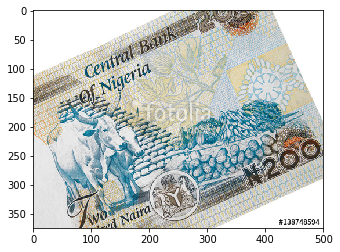

In [9]:
# this assigns the 2nd image in N200 folder in valid folder to a variable.img = plt.imread(f'{PATH}valid/N200/(files[2])') 
img = plt.imread(f'{PATH}valid/N200/{files[2]}') 
# this will plot img
plt.imshow(img);

In [10]:
# The shape function gives us the dimension of the image (row x column) in pixel and the 
# picture type. Its and RGB image, so we will have (row x column x 3)
img.shape

(375, 500, 3)

In [11]:
img[:4,:4]   ## fnnfjoljno

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]], dtype=uint8)

## My first image classification model

We're going to use a pre-trained model, that is, a model created by some one else to solve a different problem. Instead of building a model from scratch to solve a similar problem, we'll use a model trained on ImageNet (1.2 million images and 1000 classes) as a starting point. The model is a Convolutional Neural Network (CNN), a type of Neural Network that builds state-of-the-art models for computer vision. We'll be learning all about CNNs during this fast.ai course.

We will be using the resnet34 model. resnet34 is a version of the model that won the 2015 ImageNet competition. Here is more info on resnet models. We'll be studying them in depth later, but for now we'll focus on using them effectively.

Here's how to train and evalulate a naira currencies in 3 lines of code, and under 20 seconds:

In [12]:
# Uncomment the below if you need to reset your precomputed activations
#!rm -rf {PATH}tmp

In [13]:
arch = resnet34
data = ImageClassifierData.from_paths(PATH, tfms=tfms_from_model(arch, sz))
learn = ConvLearner.pretrained(arch, data, precompute=True)
learn.fit(0.01, 3) # 0.01 is the learning rate and 3 is the number of epoch

HBox(children=(IntProgress(value=0, description='Epoch', max=3), HTML(value='')))

[0.      2.59111 2.22547 0.14397]                       
[1.      2.35985 1.65343 0.40737]               
[2.      2.0288  1.12226 0.75893]               



1. The first column is the epoch number (the number of times it has been through the entire dataset)
2. The second column is the loss on the dataset
3. The third column is the loss on the validation set (validation set is used to check accuracy)
4. The foruth column show us the accuracy 

How good is this model? Well, as we mentioned, prior to this competition, the state of the art was 80% accuracy. But the competition resulted in a huge jump to 98.9% accuracy, with the author of a popular deep learning library winning the competition. Extraordinarily, less than 4 years later, we can now beat that result in seconds! Even last year in this same course, our initial model had 98.3% accuracy, which is nearly double the error we're getting just a year later, and that took around 10 minutes to compute.

## Analysing the Result of the Classification i.e looking at the pictures

Lets examine the dataset in the valid folder
As well as looking at the overall metrics, it's also a good idea to look at examples of each of:
1. A few correct labels at random
2. A few incorrect labels at random
3. The most correct labels of each class (ie those with highest probability that are correct)
4. The most incorrect labels of each class (ie those with highest probability that are incorrect)
5. The most uncertain labels (ie those with probability closest to 0.5).

In [14]:
# This is the label for a val data
# The numbers represent the 7 different classes
data.val_y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7])

In [15]:
# from here we know that 'N10' is label 0, 'N100' is label 1, 'N1000' is label 2 and so on.
data.classes

['N10', 'N100', 'N1000', 'N20', 'N200', 'N5', 'N50', 'N500']

In [16]:
# this gives prediction for validation set. Predictions are in log scale
log_preds = learn.predict()
log_preds.shape

(120, 8)

In [17]:
log_preds[:10]

array([[-1.14855, -2.76362, -2.93023, -2.47256, -2.57992, -1.66548, -2.84372, -1.83884],
       [-1.6689 , -2.58462, -2.37687, -1.66455, -2.23902, -2.39539, -2.45385, -1.76994],
       [-0.84561, -2.38659, -3.70074, -2.68935, -3.4009 , -2.0541 , -1.74241, -3.00619],
       [-1.28723, -2.21531, -2.25076, -2.49656, -2.51062, -2.04861, -2.20898, -2.23291],
       [-1.28354, -2.88584, -2.83562, -2.72044, -1.51081, -1.97984, -3.06663, -1.98626],
       [-0.71926, -2.21942, -3.13735, -2.53677, -2.46468, -2.34664, -2.9551 , -3.01808],
       [-1.34929, -3.7415 , -2.23722, -2.85678, -1.27176, -1.66297, -2.92811, -3.53235],
       [-1.13392, -2.09922, -2.36545, -2.74292, -2.47959, -2.14758, -2.13522, -2.54306],
       [-0.75441, -3.10461, -2.87294, -2.36584, -3.64206, -3.36846, -1.47814, -3.08422],
       [-0.81707, -2.57857, -3.32619, -2.53495, -1.97711, -2.60225, -2.44102, -2.69487]], dtype=float32)

In [18]:
preds = np.argmax(log_preds, axis=1)  # from log probabilities to 0 or 1
probs = np.exp(log_preds[:,1])        # pr(dog)

In [19]:
def rand_by_mask(mask): return np.random.choice(np.where(mask)[0], 4, replace=False)
def rand_by_correct(is_correct): return rand_by_mask((preds == data.val_y)==is_correct)

In [20]:
def plot_val_with_title(idxs, title):
    imgs = np.stack([data.val_ds[x][0] for x in idxs])
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(data.val_ds.denorm(imgs), rows=1, titles=title_probs)

In [21]:
def plots(ims, figsize=(12,6), rows=1, titles=None):
    f = plt.figure(figsize=figsize)
    for i in range(len(ims)):
        sp = f.add_subplot(rows, len(ims)//rows, i+1)
        sp.axis('Off')
        if titles is not None: sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i])

In [22]:
def load_img_id(ds, idx): return np.array(PIL.Image.open(PATH+ds.fnames[idx]))

def plot_val_with_title(idxs, title):
    imgs = [load_img_id(data.val_ds,x) for x in idxs]
    title_probs = [probs[x] for x in idxs]
    print(title)
    return plots(imgs, rows=1, titles=title_probs, figsize=(16,8))

Correctly classified


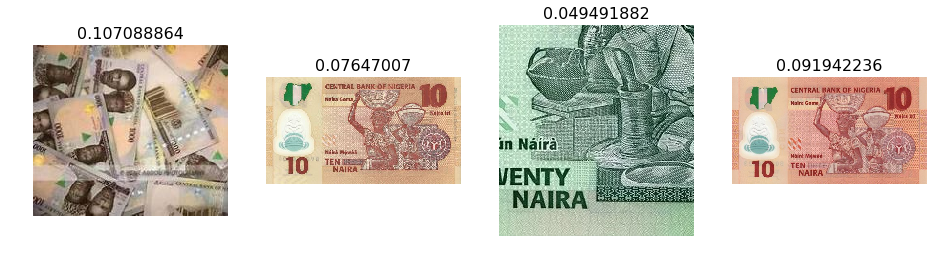

In [23]:
# 1. A few correct labels at random
plot_val_with_title(rand_by_correct(True), "Correctly classified")

Incorrectly classified


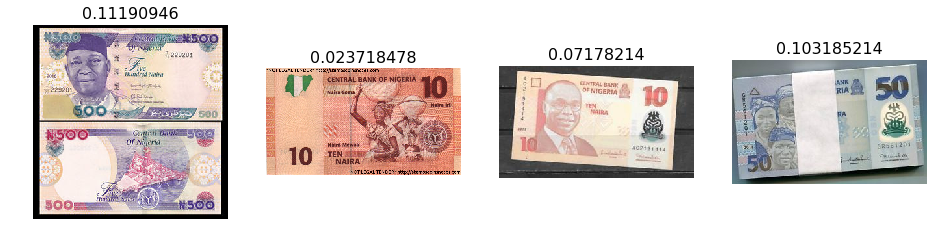

In [24]:
# 2. A few incorrect labels at random
plot_val_with_title(rand_by_correct(False), "Incorrectly classified")

In [25]:
def most_by_mask(mask, mult):
    idxs = np.where(mask)[0]
    return idxs[np.argsort(mult * probs[idxs])[:4]]

def most_by_correct(y, is_correct): 
    mult = -1 if (y==1)==is_correct else 1
    return most_by_mask((preds == data.val_y)==is_correct & (data.val_y == y), mult)

Most correct N10


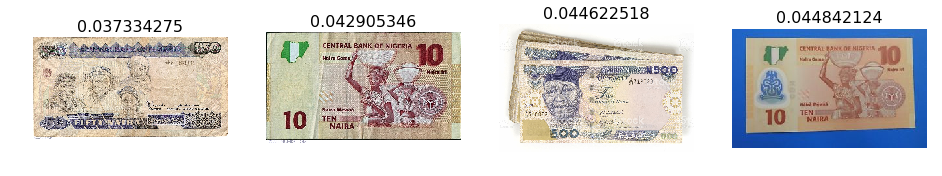

In [26]:
plot_val_with_title(most_by_correct(0, True), "Most correct N10")

Most correct N100


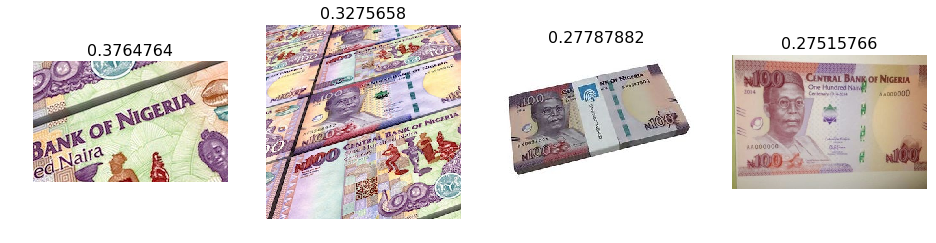

In [27]:
plot_val_with_title(most_by_correct(1, True), "Most correct N100")

Most correct N1000


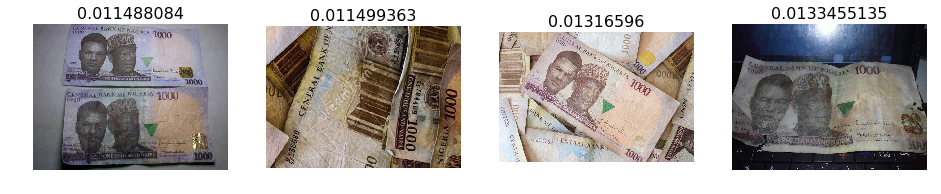

In [28]:
plot_val_with_title(most_by_correct(2, True), "Most correct N1000")

Most correct N20


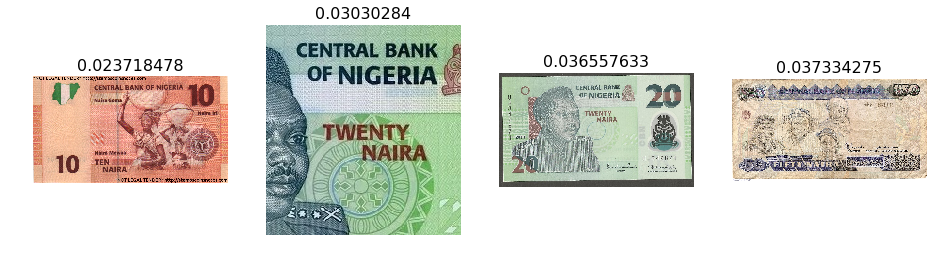

In [29]:
plot_val_with_title(most_by_correct(3, True), "Most correct N20")

Most correct N200


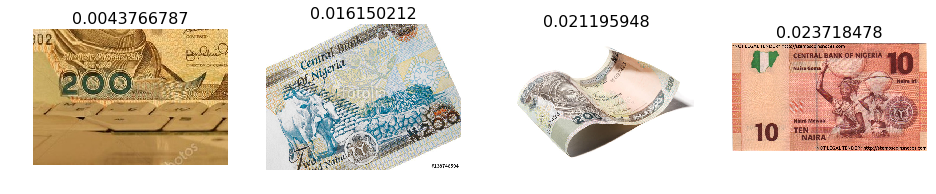

In [30]:
plot_val_with_title(most_by_correct(4, True), "Most correct N200")

Most correct N5


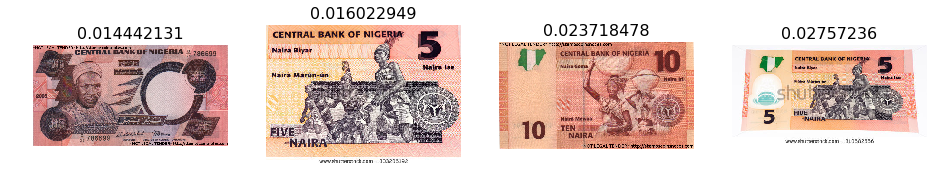

In [31]:
plot_val_with_title(most_by_correct(5, True), "Most correct N5")

Most correct N50


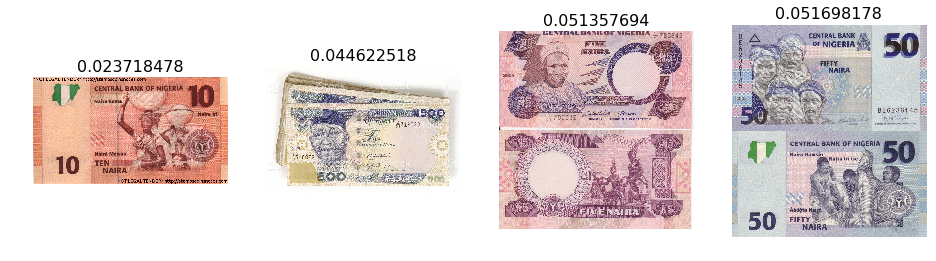

In [32]:
plot_val_with_title(most_by_correct(6, True), "Most correct N50")

Most correct N500


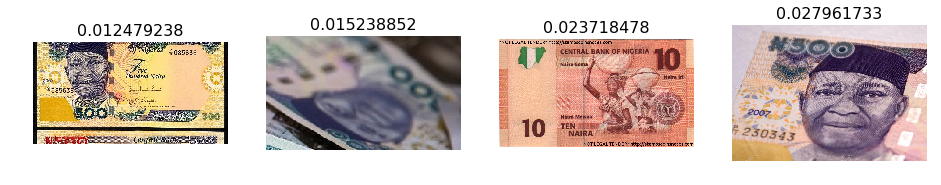

In [33]:
plot_val_with_title(most_by_correct(7, True), "Most correct N500")

Most incorrect N10


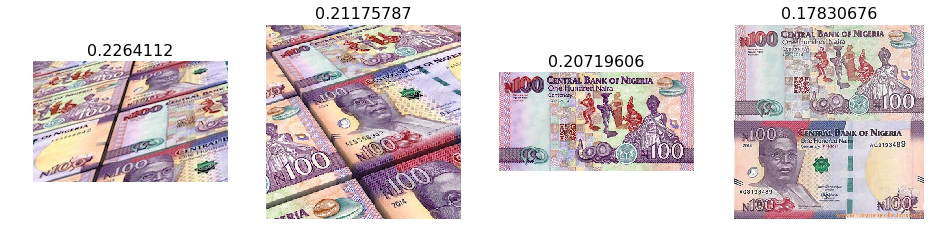

In [34]:
plot_val_with_title(most_by_correct(0, False), "Most incorrect N10")

Most incorrect N100


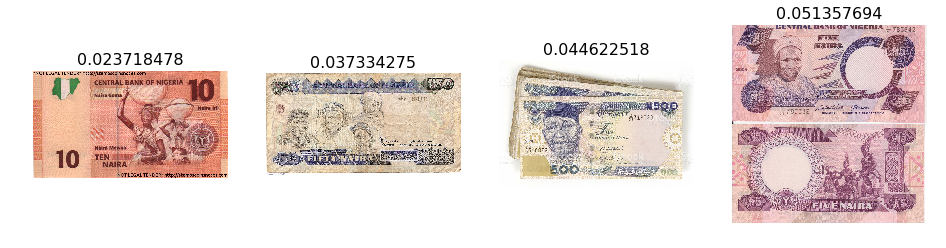

In [35]:
plot_val_with_title(most_by_correct(1, False), "Most incorrect N100")

Most incorrect N1000


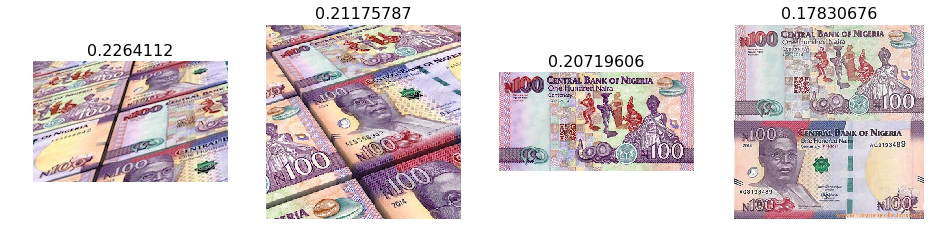

In [36]:
plot_val_with_title(most_by_correct(2, False), "Most incorrect N1000")

Most incorrect N20


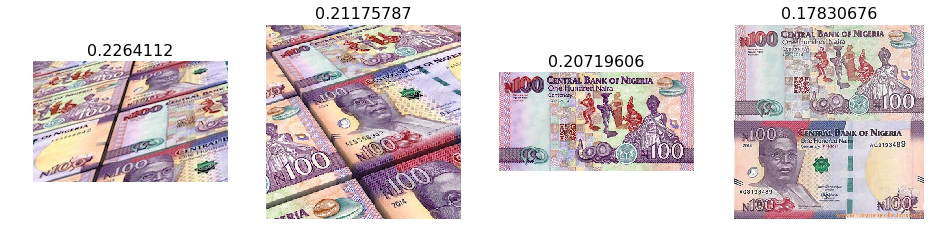

In [37]:
plot_val_with_title(most_by_correct(3, False), "Most incorrect N20")

Most incorrect N200


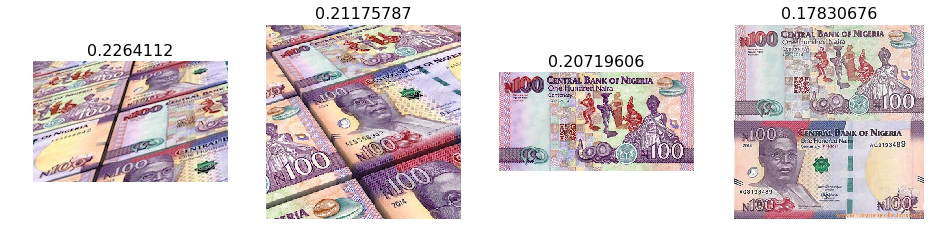

In [38]:
plot_val_with_title(most_by_correct(4, False), "Most incorrect N200")

Most incorrect N5


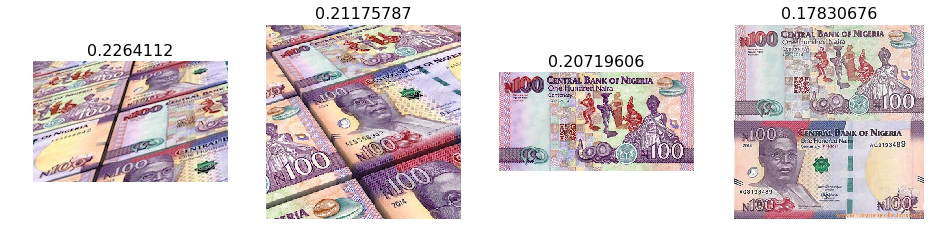

In [39]:
plot_val_with_title(most_by_correct(5, False), "Most incorrect N5")

Most incorrect N50


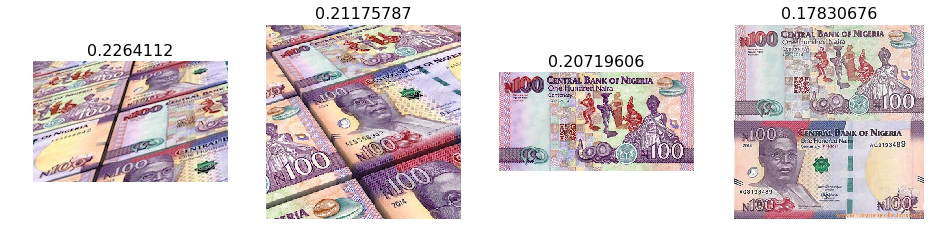

In [40]:
plot_val_with_title(most_by_correct(6, False), "Most incorrect N50")

Most incorrect N500


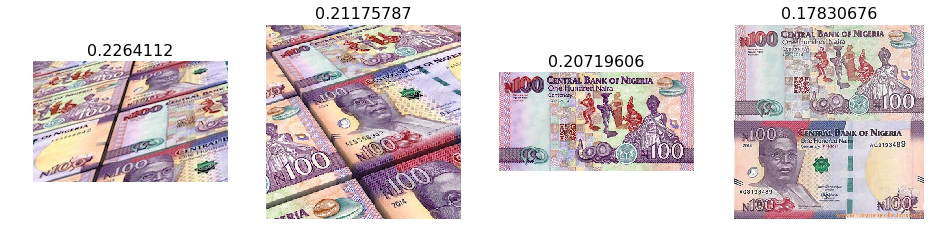

In [41]:
plot_val_with_title(most_by_correct(7, False), "Most incorrect N500")

Most uncertain predictions


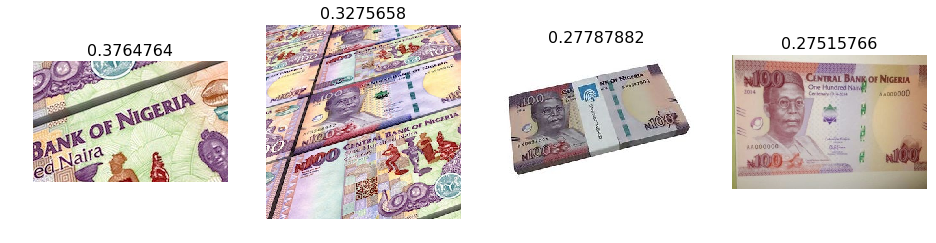

In [42]:
most_uncertain = np.argsort(np.abs(probs -0.5))[:4]
plot_val_with_title(most_uncertain, "Most uncertain predictions")

## Choosing Learning Rate

In deep learning and other mathematical models we are usually requaired to minimize a function. Learning rate determines how quickly we get to the minimum point. You can look at the leat=rning rate as length of steps taken to minimize the function.
The learning rate determines how quickly or how slowly you want to update the weights (or parameters). Learning rate is one of the most difficult parameters to set, because it significantly affect model performance.

The method learn.lr_find() helps you find an optimal learning rate. It uses the technique developed in the 2015 paper Cyclical Learning Rates for Training Neural Networks, where we simply keep increasing the learning rate from a very small value, until the loss starts decreasing. We can plot the learning rate across batches to see what this looks like.
We first create a new learner, since we want to know how to set the learning rate for a new (untrained) model.

In [43]:
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [44]:
lrf=learn.lr_find()

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

[0.      2.70396 1.12578 0.69643]               



Our learn object contains an attribute sched that contains our learning rate scheduler, and has some convenient plotting functionality including this one:

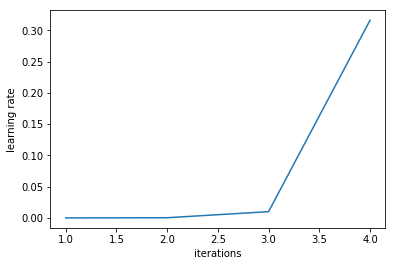

In [45]:
#This plot is the most useful. 
# Going back one magnitude from the lowset point on the graph gives us a perfect learning rate
#The learning rate is a hyper parameter
# I used this learning rate for the first classification
learn.sched.plot_lr()

Note that in the previous plot *iteration* is one iteration (or *minibatch*) of SGD. In one epoch there are 
(num_train_samples/num_iterations) of SGD.

We can see the plot of loss versus learning rate to see where our loss stops decreasing:

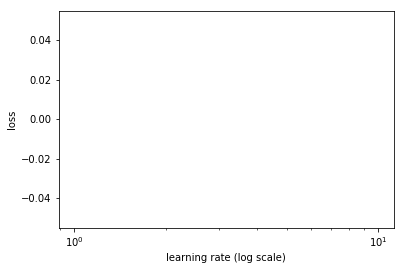

In [46]:
learn.sched.plot()

The loss is still clearly improving at lr=1e-2 (0.01), so that's what we use. Note that the optimal learning rate can change as we training the model, so you may want to re-run this function from time to time.

## Improving on our Model

### Data Augmentation

If you try training for more epochs, you'll notice that we start to *overfit*, which means that our model is learning to recognize the specific images in the training set, rather than generalizaing such that we also get good results on the validation set. One way to fix this is to effectively create more data, through *data augmentation*. This refers to randomly changing the images in ways that shouldn't impact their interpretation, such as horizontal flipping, zooming, and rotating.

We can do this by passing `aug_tfms` (*augmentation transforms*) to `tfms_from_model`, with a list of functions to apply that randomly change the image however we wish. For photos that are largely taken from the side (e.g. most photos of dogs and cats, as opposed to photos taken from the top down, such as satellite imagery) we can use the pre-defined list of functions `transforms_side_on`. We can also specify random zooming of images up to specified scale by adding the `max_zoom` parameter.

In [47]:
tfms = tfms_from_model(resnet34, sz, aug_tfms=transforms_side_on, max_zoom=1.1)

In [48]:
# this builds a data multiple time. ie. this particular one build 6 times
def get_augs():
    data = ImageClassifierData.from_paths(PATH, bs=2, tfms=tfms, num_workers=1)
    x,_ = next(iter(data.aug_dl))
    return data.trn_ds.denorm(x)[1]

In [49]:
ims = np.stack([get_augs() for i in range(6)])

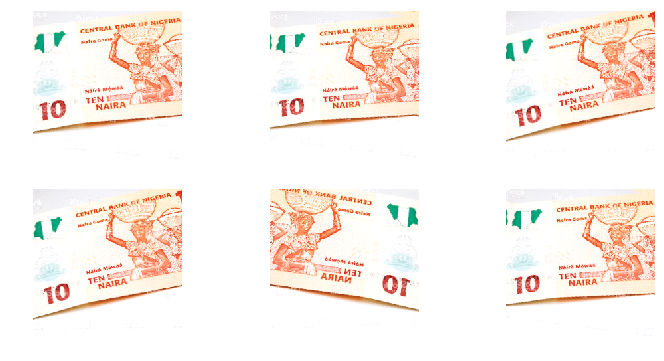

In [50]:
plots(ims, rows=2)

note: you dont flip anyhow. 

Let's create a new `data` object that includes this augmentation in the transforms.

In [51]:
data = ImageClassifierData.from_paths(PATH, tfms=tfms)
learn = ConvLearner.pretrained(arch, data, precompute=True)

In [52]:
learn.fit(1e-2, 1)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

[0.      2.45899 2.03029 0.29911]               



In [53]:
learn.precompute=False

By default when we create a learner, it sets all but the last layer to *frozen*. That means that it's still only updating the weights in the last layer when we call `fit`.

In [54]:
#column1- epoch number
#column2- training loss (if the training loss is < validation, overfitting will occur )
#column3- validation loss
learn.fit(1e-2, 3, cycle_len=1)   ##the accuracy gotten was about 99%

HBox(children=(IntProgress(value=0, description='Epoch', max=3), HTML(value='')))

[0.      2.25231 1.83942 0.42411]                       
[1.      2.12607 1.57633 0.57589]                       
[2.      1.98181 1.28032 0.66629]                       



What is that `cycle_len` parameter? What we've done here is used a technique called *stochastic gradient descent with restarts (SGDR)*, a variant of *learning rate annealing*, which gradually decreases the learning rate as training progresses. This is helpful because as we get closer to the optimal weights, we want to take smaller steps.

However, we may find ourselves in a part of the weight space that isn't very resilient - that is, small changes to the weights may result in big changes to the loss. We want to encourage our model to find parts of the weight space that are both accurate and stable. Therefore, from time to time we increase the learning rate (this is the 'restarts' in 'SGDR'), which will force the model to jump to a different part of the weight space if the current area is "spikey". Here's a picture of how that might look if we reset the learning rates 3 times (in this paper they call it a "cyclic LR schedule"):

<img src="images/sgdr.png" width="60%">
(From the paper [Snapshot Ensembles](https://arxiv.org/abs/1704.00109)).

The number of epochs between resetting the learning rate is set by `cycle_len`, and the number of times this happens is refered to as the *number of cycles*, and is what we're actually passing as the 2nd parameter to `fit()`. So here's what our actual learning rates looked like:

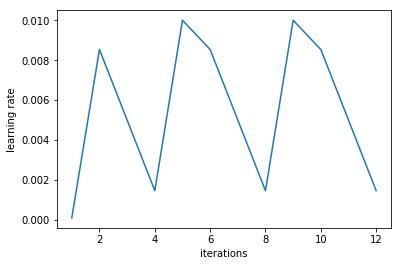

In [55]:
learn.sched.plot_lr()

Our validation loss isn't improving much, so there's probably no point further training the last layer on its own.

Since we've got a pretty good model at this point, we might want to save it so we can load it again later without training it from scratch.

In [56]:
learn.save('224_lastlayer')

In [57]:
learn.load('224_lastlayer')

### Fine-tuning and differential learning rate annealing

Now that we have a good final layer trained, we can try fine-tuning the other layers. To tell the learner that we want to unfreeze the remaining layers, just call (surprise surprise!) `unfreeze()`.

In [58]:
learn.unfreeze()

Note that the other layers have *already* been trained to recognize imagenet photos (whereas our final layers where randomly initialized), so we want to be careful of not destroying the carefully tuned weights that are already there.

Generally speaking, the earlier layers (as we've seen) have more general-purpose features. Therefore we would expect them to need less fine-tuning for new datasets. For this reason we will use different learning rates for different layers: the first few layers will be at 1e-4, the middle layers at 1e-3, and our FC layers we'll leave at 1e-2 as before. We refer to this as *differential learning rates*, although there's no standard name for this techique in the literature that we're aware of.

In [59]:
lr=np.array([1e-4,1e-3,1e-2])

In [60]:
learn.fit(lr, 3, cycle_len=1, cycle_mult=2)

HBox(children=(IntProgress(value=0, description='Epoch', max=7), HTML(value='')))

[0.      1.82667 1.18111 0.73103]                       
[1.      1.71382 0.89597 0.82254]                       
[2.      1.57444 0.78736 0.86719]                       
[3.      1.42684 0.48266 0.93415]                       
[4.      1.26886 0.33642 0.94196]                       
[5.      1.13818 0.29043 0.94978]                       
[6.      1.01893 0.28774 0.95759]                       



Another trick we've used here is adding the `cycle_mult` parameter. Take a look at the following chart, and see if you can figure out what the parameter is doing:

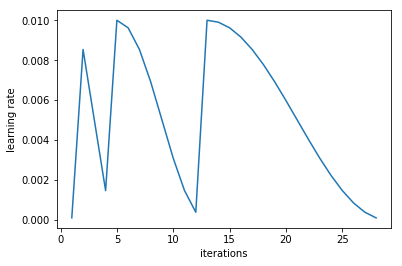

In [61]:
learn.sched.plot_lr()

Note that's what being plotted above is the learning rate of the *final layers*. The learning rates of the earlier layers are fixed at the same multiples of the final layer rates as we initially requested (i.e. the first layers have 100x smaller, and middle layers 10x smaller learning rates, since we set `lr=np.array([1e-4,1e-3,1e-2])`.

In [62]:
learn.save('224_all')

In [63]:
learn.load('224_all')

There is something else we can do with data augmentation: use it at *inference* time (also known as *test* time). Not surprisingly, this is known as *test time augmentation*, or just *TTA*.

TTA simply makes predictions not just on the images in your validation set, but also makes predictions on a number of randomly augmented versions of them too (by default, it uses the original image along with 4 randomly augmented versions). It then takes the average prediction from these images, and uses that. To use TTA on the validation set, we can use the learner's `TTA()` method.

In [64]:
log_preds,y = learn.TTA()
probs = np.mean(np.exp(log_preds),0)

In [65]:
accuracy(probs, y)

0.9583333333333334

I generally see about a 10-20% reduction in error on this dataset when using TTA at this point, which is an amazing result for such a quick and easy technique!

## Analyzing results

### Confusion matrix 

In [66]:
preds = np.argmax(probs, axis=1)
probs = probs[:,1]

A common way to analyze the result of a classification model is to use a [confusion matrix](http://www.dataschool.io/simple-guide-to-confusion-matrix-terminology/). Scikit-learn has a convenient function we can use for this purpose:

In [67]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y, preds)

We can just print out the confusion matrix, or we can show a graphical view (which is mainly useful for dependents with a larger number of categories).

[[15  0  0  0  0  0  0  0]
 [ 0 15  0  0  0  0  0  0]
 [ 0  0 15  0  0  0  0  0]
 [ 0  0  0 13  1  0  1  0]
 [ 0  0  0  0 15  0  0  0]
 [ 0  0  0  0  0 13  2  0]
 [ 0  0  0  0  0  0 15  0]
 [ 0  0  0  0  1  0  0 14]]


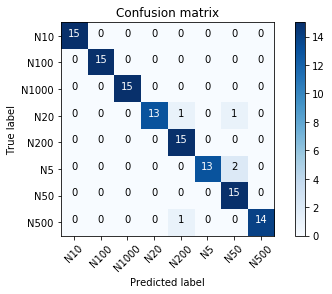

In [68]:
plot_confusion_matrix(cm, data.classes)

### Looking at pictures again

Most correct N10


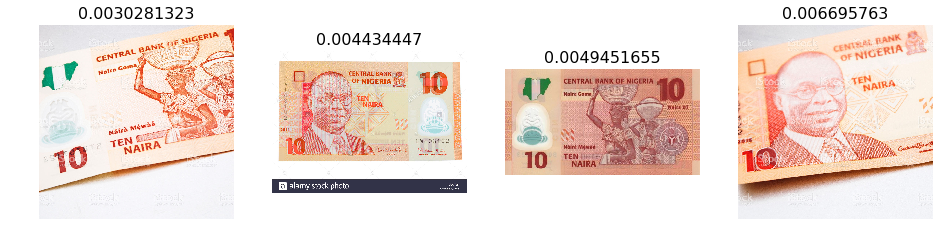

In [69]:
plot_val_with_title(most_by_correct(0, True), "Most correct N10")

Most correct N50


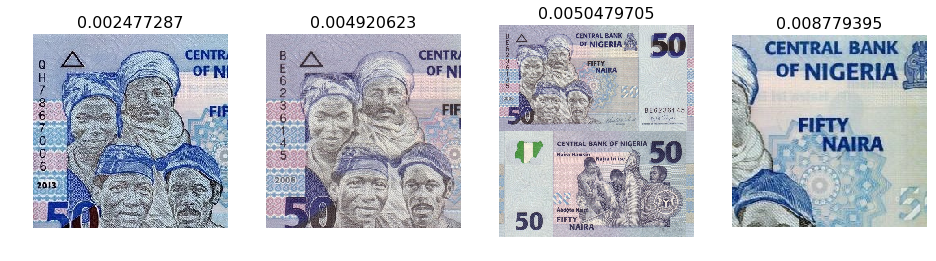

In [77]:
plot_val_with_title(most_by_correct(6, True), "Most correct N50")

Most correct N100


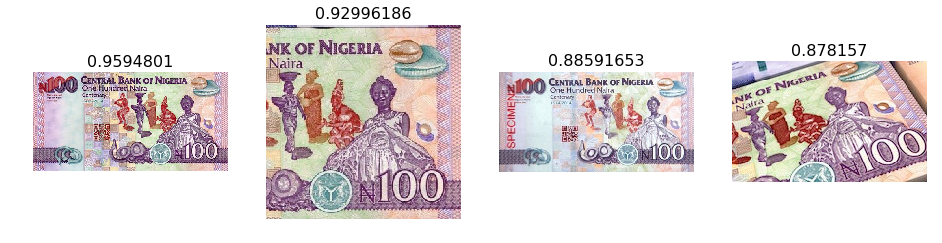

In [70]:
plot_val_with_title(most_by_correct(1, True), "Most correct N100")

Most correct N200


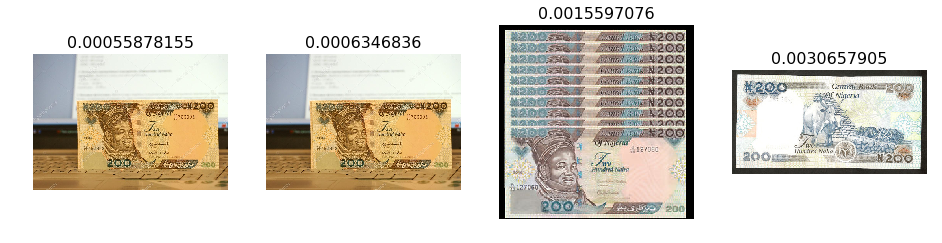

In [71]:
plot_val_with_title(most_by_correct(4, True), "Most correct N200")

Most correct N500


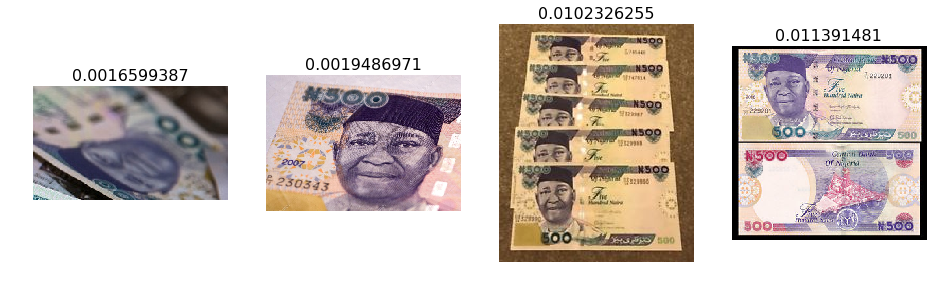

In [72]:
plot_val_with_title(most_by_correct(7, True), "Most correct N500")

Most incorrect N10


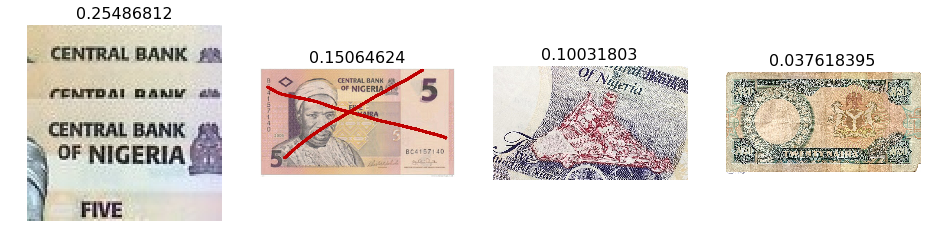

In [73]:
plot_val_with_title(most_by_correct(0, False), "Most incorrect N10")

Most incorrect N100


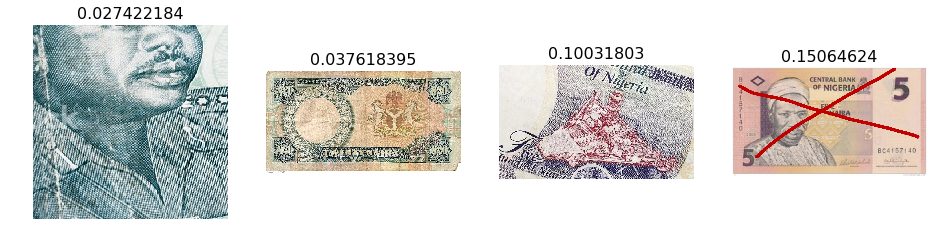

In [74]:
plot_val_with_title(most_by_correct(1, False), "Most incorrect N100")

Most incorrect N200


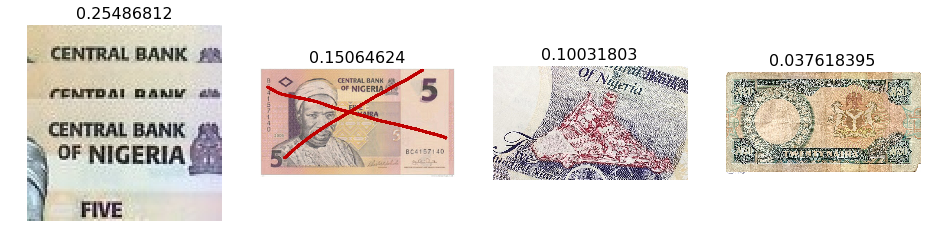

In [75]:
plot_val_with_title(most_by_correct(4, False), "Most incorrect N200")

Most incorrect N500


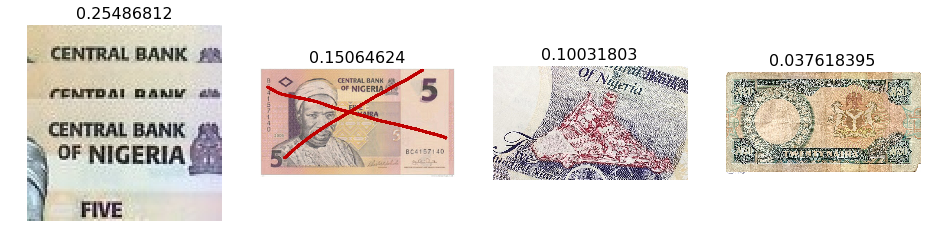

In [76]:
plot_val_with_title(most_by_correct(7, False), "Most incorrect N500")

## Review: easy steps to train a world-class image classifier

1. Enable data augmentation, and precompute=True
1. Use `lr_find()` to find highest learning rate where loss is still clearly improving
1. Train last layer from precomputed activations for 1-2 epochs
1. Train last layer with data augmentation (i.e. precompute=False) for 2-3 epochs with cycle_len=1
1. Unfreeze all layers
1. Set earlier layers to 3x-10x lower learning rate than next higher layer
1. Use `lr_find()` again
1. Train full network with cycle_mult=2 until over-fitting

## Understanding the code for our first model

Let's look at the Dogs v Cats code line by line.

**tfms** stands for *transformations*. `tfms_from_model` takes care of resizing, image cropping, initial normalization (creating data with (mean,stdev) of (0,1)), and more.

In [78]:
tfms = tfms_from_model(resnet34, sz)

We need a <b>path</b> that points to the dataset. In this path we will also store temporary data and final results. `ImageClassifierData.from_paths` reads data from a provided path and creates a dataset ready for training.

In [79]:
data = ImageClassifierData.from_paths(PATH, tfms=tfms)

`ConvLearner.pretrained` builds *learner* that contains a pre-trained model. The last layer of the model needs to be replaced with the layer of the right dimensions. The pretained model was trained for 1000 classes therfore the final layer predicts a vector of 1000 probabilities. The model for cats and dogs needs to output a two dimensional vector. The diagram below shows in an example how this was done in one of the earliest successful CNNs. The layer "FC8" here would get replaced with a new layer with 2 outputs.

<img src="images/pretrained.png" width="500">
[original image](https://image.slidesharecdn.com/practicaldeeplearning-160329181459/95/practical-deep-learning-16-638.jpg)

In [80]:
learn = ConvLearner.pretrained(resnet34, data, precompute=True)

*Parameters*  are learned by fitting a model to the data. *Hyparameters* are another kind of parameter, that cannot be directly learned from the regular training process. These parameters express “higher-level” properties of the model such as its complexity or how fast it should learn. Two examples of hyperparameters are the *learning rate* and the *number of epochs*.

During iterative training of a neural network, a *batch* or *mini-batch* is a subset of training samples used in one iteration of Stochastic Gradient Descent (SGD). An *epoch* is a single pass through the entire training set which consists of multiple iterations of SGD.

We can now *fit* the model; that is, use *gradient descent* to find the best parameters for the fully connected layer we added, that can separate cat pictures from dog pictures. We need to pass two hyperameters: the *learning rate* (generally 1e-2 or 1e-3 is a good starting point, we'll look more at this next) and the *number of epochs* (you can pass in a higher number and just stop training when you see it's no longer improving, then re-run it with the number of epochs you found works well.)

In [81]:
learn.fit(1e-2, 1)

HBox(children=(IntProgress(value=0, description='Epoch', max=1), HTML(value='')))

[0.      2.47499 2.131   0.14844]               



## Analyzing results: loss and accuracy

When we run `learn.fit` we print 3 performance values (see above.) Here 0.03 is the value of the **loss** in the training set, 0.0226 is the value of the loss in the validation set and 0.9927 is the validation accuracy. What is the loss? What is accuracy? Why not to just show accuracy?

**Accuracy** is the ratio of correct prediction to the total number of predictions.

In machine learning the **loss** function or cost function is representing the price paid for inaccuracy of predictions.

The loss associated with one example in binary classification is given by:
`-(y * log(p) + (1-y) * log (1-p))`
where `y` is the true label of `x` and `p` is the probability predicted by our model that the label is 1.

In [82]:
def binary_loss(y, p):
    return np.mean(-(y * np.log(p) + (1-y)*np.log(1-p)))

In [83]:
acts = np.array([1, 0, 0, 1])
preds = np.array([0.9, 0.1, 0.2, 0.8])
binary_loss(acts, preds)

0.164252033486018

Note that in our toy example above our accuracy is 100% and our loss is 0.16. Compare that to a loss of 0.03 that we are getting while predicting cats and dogs. Exercise: play with `preds` to get a lower loss for this example. 

**Example:** Here is an example on how to compute the loss for one example of binary classification problem. Suppose for an image x with label 1 and your model gives it a prediction of 0.9. For this case the loss should be small because our model is predicting a label $1$ with high probability.

`loss = -log(0.9) = 0.10`

Now suppose x has label 0 but our model is predicting 0.9. In this case our loss is should be much larger.

loss = -log(1-0.9) = 2.30

- Exercise: look at the other cases and convince yourself that this make sense.
- Exercise: how would you rewrite `binary_loss` using `if` instead of `*` and `+`?

Why not just maximize accuracy? The binary classification loss is an easier function to optimize.